In [1]:
import open3d as o3d
import open3d.core as o3c

if o3d.__DEVICE_API__ == 'cuda':
    import open3d.cuda.pybind.t.pipelines.registration as treg
else:
    import open3d.cpu.pybind.t.pipelines.registration as treg

import numpy as np
import sys
import os
import time

# monkey patches visualization and provides helpers to load geometries
sys.path.append('..')
import open3d_tutorial as o3dtut
# change to True if you want to interact with the visualization windows
o3dtut.interactive = not "CI" in os.environ

[download_utils.py] /home/rey/workspace/isl/clean/Open3D/examples/test_data/open3d_downloads/RGBD/normal_map.npy already exists, skipped.
[download_utils.py] /home/rey/workspace/isl/clean/Open3D/examples/test_data/open3d_downloads/RGBD/raycast_vtx_004.npy already exists, skipped.
[download_utils.py] /home/rey/workspace/isl/clean/Open3D/examples/test_data/open3d_downloads/tests/bunnyData.pts already exists, skipped.
[download_utils.py] /home/rey/workspace/isl/clean/Open3D/examples/test_data/open3d_downloads/tests/point_cloud_sample1.pts already exists, skipped.
[download_utils.py] /home/rey/workspace/isl/clean/Open3D/examples/test_data/open3d_downloads/tests/point_cloud_sample2.pts already exists, skipped.
[download_utils.py] /home/rey/workspace/isl/clean/Open3D/examples/test_data/open3d_downloads/tests/cube.obj already exists, skipped.
[download_utils.py] /home/rey/workspace/isl/clean/Open3D/examples/test_data/open3d_downloads/RGBD/vertex_map.npy already exists, skipped.


# ICP registration
This tutorial demonstrates the ICP (Iterative Closest Point) registration algorithm. It has been a mainstay of geometric registration in both research and industry for many years. The inputs are two point clouds and an initial transformation that roughly aligns the source point cloud to the target point cloud. The output is a refined transformation that tightly aligns the two point clouds. A helper function `draw_registration_result` visualizes the alignment during the registration process. In this tutorial, we show differnt ICP variants, and the API for using them.

## Helper visualization function

The function below visualizes a target point cloud and a source point cloud transformed with an alignment transformation. The target point cloud and the source point cloud are painted with cyan and yellow colors respectively. The more and tighter the two point-clouds overlap with each other, the better the alignment result.

In [2]:
def draw_registration_result(source, target, transformation):
    source_temp = source.clone()
    target_temp = target.clone()

    source_temp.transform(transformation)

    # This is patched version for tutorial rendering.
    # Use `draw` function for you application.
    o3d.visualization.draw_geometries(
        [source_temp.to_legacy(),
         target_temp.to_legacy()],
        zoom=0.4459,
        front=[0.9288, -0.2951, -0.2242],
        lookat=[1.6784, 2.0612, 1.4451],
        up=[-0.3402, -0.9189, -0.1996])

## Understanding ICP Algorithm

In general, the ICP algorithm iterates over two steps:

1. Find correspondence set $\mathcal{K}=\{(\mathbf{p}, \mathbf{q})\}$ from target point cloud $\mathbf{P}$, and source point cloud $\mathbf{Q}$ transformed with current transformation matrix $\mathbf{T}$.
2. Update the transformation $\mathbf{T}$ by minimizing an objective function $E(\mathbf{T})$ defined over the correspondence set $\mathcal{K}$.

Different variants of ICP use different objective functions $E(\mathbf{T})$ [\[BeslAndMcKay1992\]](../reference.html#beslandmckay1992) [\[ChenAndMedioni1992\]](../reference.html#chenandmedioni1992) [\[Park2017\]](../reference.html#park2017).

### Different variants of ICP

#### Point-to-point ICP

We first show a point-to-point ICP algorithm [\[BeslAndMcKay1992\]](../reference.html#beslandmckay1992) using the objective

\begin{equation}
E(\mathbf{T}) = \sum_{(\mathbf{p},\mathbf{q})\in\mathcal{K}}\|\mathbf{p} - \mathbf{T}\mathbf{q}\|^{2}
\end{equation}

The class `TransformationEstimationPointToPoint` provides functions to compute the residuals and Jacobian matrices of the point-to-point ICP objective.

---

#### Point-to-plane ICP
The point-to-plane ICP algorithm [\[ChenAndMedioni1992\]](../reference.html#chenandmedioni1992) uses a different objective function

\begin{equation}
E(\mathbf{T}) = \sum_{(\mathbf{p},\mathbf{q})\in\mathcal{K}}\big((\mathbf{p} - \mathbf{T}\mathbf{q})\cdot\mathbf{n}_{\mathbf{p}}\big)^{2},
\end{equation}

where $\mathbf{n}_{\mathbf{p}}$ is the normal of point $\mathbf{p}$. [\[Rusinkiewicz2001\]](../reference.html#rusinkiewicz2001) has shown that the point-to-plane ICP algorithm has a faster convergence speed than the point-to-point ICP algorithm.

The class `TransformationEstimationPointToPlane` provides functions to compute the residuals and Jacobian matrices of the point-to-plane ICP objective. 

---

#### Colored ICP

Following [\[Park2017\]](../reference.html#park2017), it runs ICP iterations with a joint optimization objective

\begin{equation}
E(\mathbf{T}) = (1-\delta)E_{C}(\mathbf{T}) + \delta E_{G}(\mathbf{T})
\end{equation}

where $\mathbf{T}$ is the transformation matrix to be estimated. $E_{C}$ and $E_{G}$ are the photometric and geometric terms, respectively. $\delta\in[0,1]$ is a weight parameter that has been determined empirically.

The geometric term $E_{G}$ is the same as the Point-to-plane ICP objective

\begin{equation}
E_{G}(\mathbf{T}) = \sum_{(\mathbf{p},\mathbf{q})\in\mathcal{K}}\big((\mathbf{p} - \mathbf{T}\mathbf{q})\cdot\mathbf{n}_{\mathbf{p}}\big)^{2},
\end{equation}

where $\mathcal{K}$ is the correspondence set in the current iteration. $\mathbf{n}_{\mathbf{p}}$ is the normal of point $\mathbf{p}$.

The color term $E_{C}$ measures the difference between the color of point $\mathbf{q}$ (denoted as $C(\mathbf{q})$) and the color of its projection on the tangent plane of $\mathbf{p}$.

\begin{equation}
E_{C}(\mathbf{T}) = \sum_{(\mathbf{p},\mathbf{q})\in\mathcal{K}}\big(C_{\mathbf{p}}(\mathbf{f}(\mathbf{T}\mathbf{q})) - C(\mathbf{q})\big)^{2},
\end{equation}

where $C_{\mathbf{p}}(\cdot)$ is a precomputed function continuously defined on the tangent plane of $\mathbf{p}$. Function$\mathbf{f}(\cdot)$ projects a 3D point to the tangent plane. For more details, refer to [\[Park2017\]](../reference.html#park2017).

To further improve efficiency, [\[Park2017\]](../reference.html#park2017) proposes a multi-scale registration scheme. 

The class `TransformationEstimationForColoredICP` provides functions to compute the residuals and Jacobian matrices of the joint optimization objective. 

---

## Understanding ICP API

<div class="alert alert-info">
    
**Note:** 

The `Tensor based ICP implementation` API is slightly different than the [Eigen based ICP implementation](../pipelines/icp_registration.rst), to support more functionalities.
    
</div>

### Input


`PointClouds` between which the `Transformation` is to be estimated. [open3d.t.PointCloud]

- Source Tensor PointCloud. [Float32 or Float64 dtypes are supported].
- Target Tensor PointCloud. [Float32 or Float64 dtypes are supported].

<div class="alert alert-info">
    
**Note:** 

The initial alignment is usually obtained by a global registration algorithm.

</div>

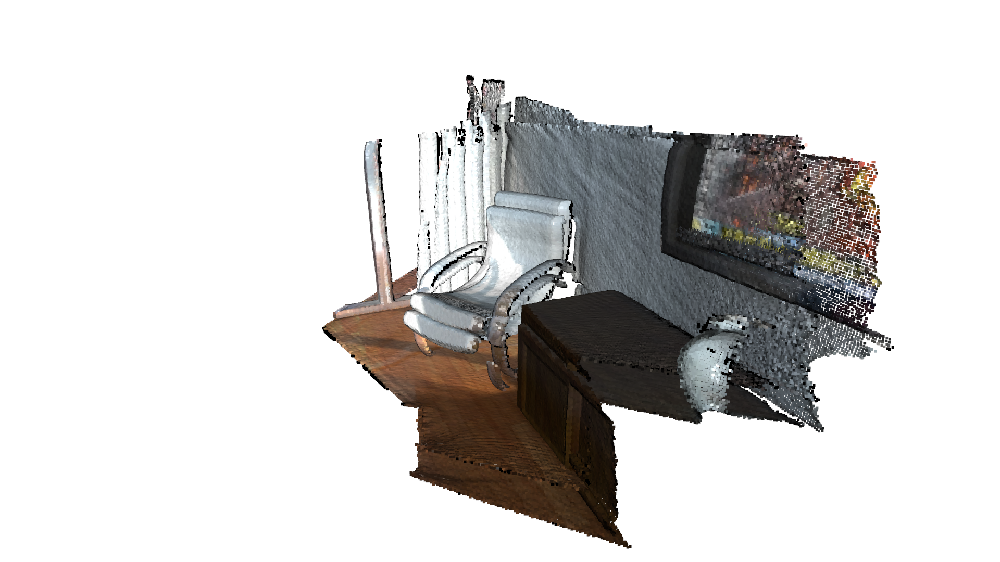

In [3]:
source = o3d.t.io.read_point_cloud("../../test_data/ICP/cloud_bin_0.pcd")
target = o3d.t.io.read_point_cloud("../../test_data/ICP/cloud_bin_1.pcd")

# For Colored-ICP `colors` attribute must be of the same dtype as `positions` and `normals` attribute.
source.point["colors"] = source.point["colors"].to(
    o3d.core.Dtype.Float32) / 255.0
target.point["colors"] = target.point["colors"].to(
    o3d.core.Dtype.Float32) / 255.0

# Initial guess transform between the two point-cloud.
# ICP algortihm requires a good initial allignment to converge efficiently.
trans_init = np.asarray([[0.862, 0.011, -0.507, 0.5],
                         [-0.139, 0.967, -0.215, 0.7],
                         [0.487, 0.255, 0.835, -1.4], [0.0, 0.0, 0.0, 1.0]])

draw_registration_result(source, target, trans_init)

---

### Parameters 

#### Max correspondence Distances
- This is the radius of distance from each point in the source point-cloud in which the neighbour search will try to find a corresponding point in the target point-cloud.
- It is a `double` for `icp`, and `utility.DoubleVector` for `multi-scale-icp`.
- One may typically keep this parameter between `1.0x - 3.0x` `voxel-size` for each scale.
- This parameter is most important for performance tuning, as a higher radius will take larger time (as the neighbour search will be performed over a larger radius).

In [4]:
# For Vanilla ICP (double)

# Search distance for Nearest Neighbour Search [Hybrid-Search is used].
max_correspondence_distance = 0.07

In [5]:
# For Multi-Scale ICP (o3d.utility.DoubleVector):

# `max_correspondence_distances` is proportianal to the resolution or the `voxel_sizes`.
# In general it is recommended to use values between 1x - 3x of the corresponding `voxel_sizes`.
# We may have a higher value of the `max_correspondence_distances` for the first coarse
# scale, as it is not much expensive, and gives us more tolerance to initial allignment.
max_correspondence_distances = o3d.utility.DoubleVector([0.3, 0.14, 0.07])

#### Initial Transform from Source to Target [open3d.core.Tensor]
- Initial estimate for transformation from source to target.
- Transformation matrix Tensor of shape [4, 4] of type `Float64` on `CPU:0` device
- The initial alignment is usually obtained by a global registration algorithm. See [Global registration](../pipelines/global_registration.rst) for examples.

In [6]:
# Initial alignment or source to target transform.
init_source_to_target = np.asarray([[0.862, 0.011, -0.507, 0.5],
                                    [-0.139, 0.967, -0.215, 0.7],
                                    [0.487, 0.255, 0.835, -1.4],
                                    [0.0, 0.0, 0.0, 1.0]])

#### Estimation Method 
- This sets the ICP method to compute the transformation between two point-clouds given the correspondences.

Options:

- **o3d.t.pipelines.registration.TransformationEstimationPointToPoint()**
    - Point to Point ICP.
- **o3d.t.pipelines.registration.TransformationEstimationPointToPlane(robust_kernel)**
    - Point to Plane ICP.
    - Requires `target point-cloud` to have `normals` attribute (of same dtype as `position` attribute).
- **o3d.t.pipelines.registration.TransformationEstimationForColoredICP(robust_kernel, lambda)**
    - Colored ICP.
    - Requires `target` point-cloud to have `normals` attribute (of same dtype as `position` attribute).
    - Requires `source` and `target` point-clouds to have `colors` attribute (of same dtype as `position` attribute).
- **o3d.t.pipelines.registration.TransformationEstimationForGeneralizedICP(robust_kernel, epsilon)** [To be added].
    - Generalized ICP.


In [7]:
# Select the `Estimation Method`, and `Robust Kernel` (for outlier-rejection).
estimation = treg.TransformationEstimationPointToPlane()

Estimation Method also supports `Robust Kernels`: Robust kernels are used for outlier rejection. More on this in `Robust Kernel` section.

`robust_kernel = o3d.t.pipelines.registration.robust_kernel.RobustKernel(method, scale, shape)`

Method options:

- robust_kernel.RobustKernelMethod.L2Loss
- robust_kernel.RobustKernelMethod.L1Loss
- robust_kernel.RobustKernelMethod.HuberLoss
- robust_kernel.RobustKernelMethod.CauchyLoss
- robust_kernel.RobustKernelMethod.GMLoss
- robust_kernel.RobustKernelMethod.TukeyLoss
- robust_kernel.RobustKernelMethod.GeneralizedLoss


#### ICP Convergence Criteria [relative rmse, relative fitness, max iterations]
- This sets the condition for termination or when the scale iterations can be considered to be converged. 
- If the relative (of change in value from the last iteration) rmse and fitness are equal or less than the specified value, the iterations for that scale will be considered as converged/completed.
- For `Multi-Scale ICP` it is a `list` of `ICPConvergenceCriteria`, for each scale of ICP, to provide more fine control over performance.
- One may keep the initial values of `relative_fitness` and `relative_rmse` low as we just want to get an estimate transformation, and high for later iterations to fine-tune.
- Iterations on higher-resolution is more costly (takes more time), so we want to do fewer iterations on higher resolution.

In [8]:
# Convergence-Criteria for Vanilla ICP:

criteria = treg.ICPConvergenceCriteria(relative_fitness=0.000001,
                                       relative_rmse=0.000001,
                                       max_iteration=50)

In [9]:
# List of Convergence-Criteria for Multi-Scale ICP:

# We can control `ConvergenceCriteria` of each `scale` individually.
# We want to keep `relative_fitness` and `relative_rmse` high (more error tolerance)
# for initial scales, i.e. we will be happy to consider ICP converged, when difference
# between 2 successive iterations for that scale is smaller than this value.
# We expect less accuracy (more error tolerance) initial coarse-scale iteration,
# and want our later scale convergence to be more accurate (less error tolerance).
criteria_list = [
    treg.ICPConvergenceCriteria(relative_fitness=0.0001,
                                relative_rmse=0.0001,
                                max_iteration=20),
    treg.ICPConvergenceCriteria(0.00001, 0.00001, 15),
    treg.ICPConvergenceCriteria(0.000001, 0.000001, 10)
]

#### Voxel Sizes
- It is the voxel size (lower voxel size corresponds to higher resolution), for each scale of multi-scale ICP.
- We want to perform initial iterations on a coarse point-cloud (low-resolution or small voxel size) (as it is more time-efficient, and avoids local-minima), and then move to a dense point-cloud (high-resolution or small voxel size. Therefore the voxel sizes must be strictly decreasing order.

In [10]:
# Vanilla ICP
voxel_size = 0.025

In [11]:
# Lower `voxel_size` is equivalent to higher resolution,
# and we want to perform iterations from coarse to dense resolution,
# therefore `voxel_sizes` must be in strictly decressing order.
voxel_sizes = o3d.utility.DoubleVector([0.1, 0.05, 0.025])

#### Save Loss Log
When `True`, it saves the iteration-wise values of `fitness`, `inlier_rmse`, `transformaton`, `scale`, `iteration` in `loss_log_` in `regsitration_result`. Default: `False`.

In [12]:
save_loss_log = True

---

## Vanilla ICP Example

#### 1. Set Inputs and Parameters

In [13]:
# Input point-clouds
source = o3d.t.io.read_point_cloud("../../test_data/ICP/cloud_bin_0.pcd")
target = o3d.t.io.read_point_cloud("../../test_data/ICP/cloud_bin_1.pcd")

In [14]:
# Search distance for Nearest Neighbour Search [Hybrid-Search is used].
max_correspondence_distance = 0.07

# Initial alignment or source to target transform.
init_source_to_target = np.asarray([[0.862, 0.011, -0.507, 0.5],
                                    [-0.139, 0.967, -0.215, 0.7],
                                    [0.487, 0.255, 0.835, -1.4],
                                    [0.0, 0.0, 0.0, 1.0]])

# Select the `Estimation Method`, and `Robust Kernel` (for outlier-rejection).
estimation = treg.TransformationEstimationPointToPlane()

# Convergence-Criteria for Vanilla ICP
criteria = treg.ICPConvergenceCriteria(relative_fitness=0.000001,
                                       relative_rmse=0.000001,
                                       max_iteration=50)
# Down-sampling voxel-size.
voxel_size = 0.025

# Save iteration wise `fitness`, `inlier_rmse`, etc. to analyse and tune result.
save_loss_log = True

#### 2. Get Registration Result from ICP

Time taken by ICP:  0.08085966110229492
Inlier Fitness:  0.6755917076201774
Inlier RMSE:  0.017589625718290713


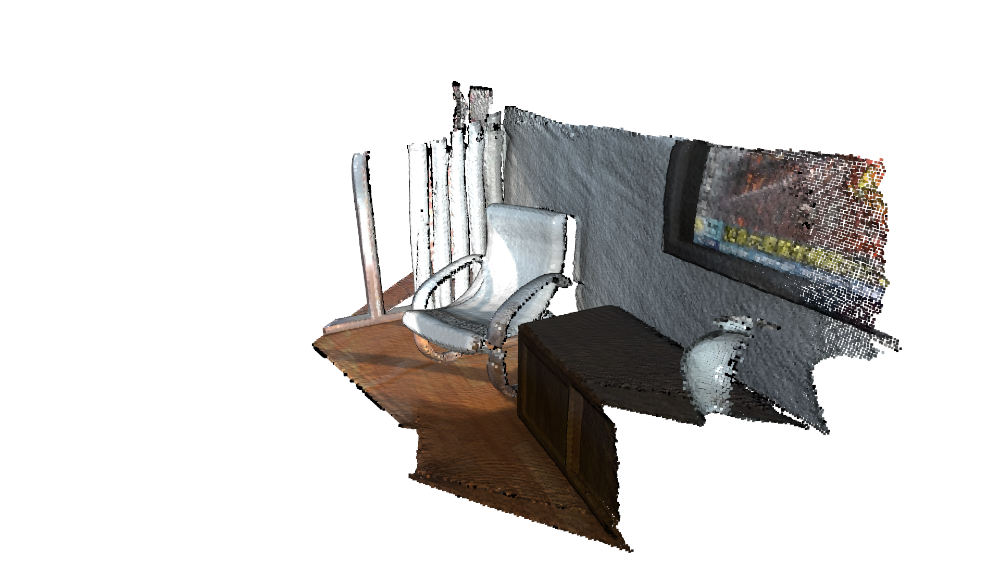

In [15]:
s = time.time()

registration_icp = treg.icp(source, target, max_correspondence_distance,
                            init_source_to_target, estimation, criteria,
                            voxel_size, save_loss_log)

icp_time = time.time() - s
print("Time taken by ICP: ", icp_time)
print("Inlier Fitness: ", registration_icp.fitness)
print("Inlier RMSE: ", registration_icp.inlier_rmse)

draw_registration_result(source, target, registration_icp.transformation)

---
Now let's try with poor initial initialisation

In [16]:
init_source_to_target = o3d.core.Tensor.eye(4, o3d.core.Dtype.Float32)
max_correspondence_distance = 0.07

Time taken by ICP:  0.12420368194580078
Inlier Fitness:  0.3159916398350562
Inlier RMSE:  0.03343873051858047


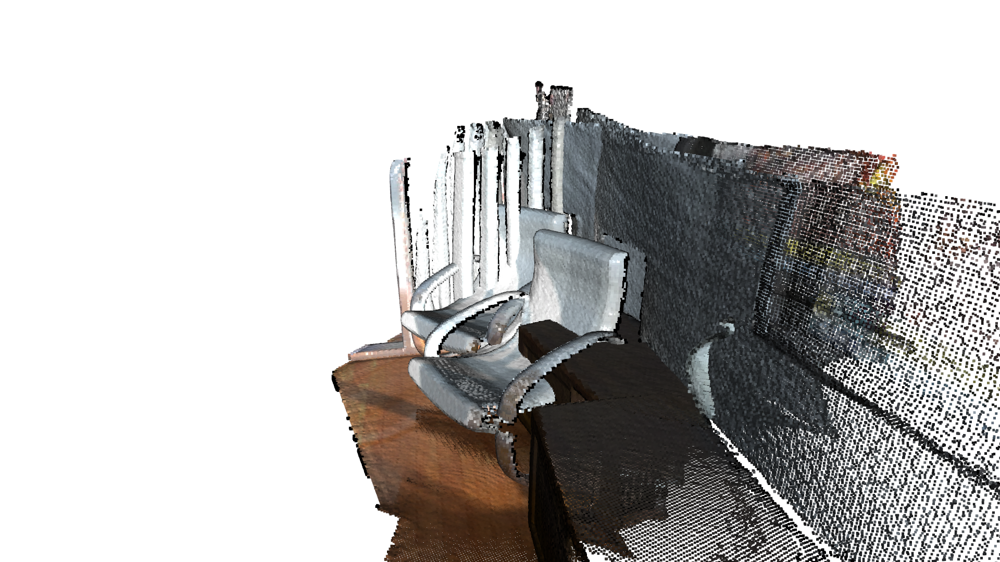

In [17]:
s = time.time()

registration_icp = treg.icp(source, target, max_correspondence_distance,
                            init_source_to_target, estimation, criteria,
                            voxel_size, save_loss_log)

icp_time = time.time() - s
print("Time taken by ICP: ", icp_time)
print("Inlier Fitness: ", registration_icp.fitness)
print("Inlier RMSE: ", registration_icp.inlier_rmse)

draw_registration_result(source, target, registration_icp.transformation)

As we can see, poor initial allignment might fail ICP convergence

Having large `max_correspondence_distance` might resolve this issue. But it will take longer to process.

In [18]:
init_source_to_target = o3d.core.Tensor.eye(4, o3c.float32)
max_correspondence_distance = 0.5

Time taken by ICP:  2.9877283573150635
Inlier Fitness:  0.8366943455911428
Inlier RMSE:  0.1333382826987151


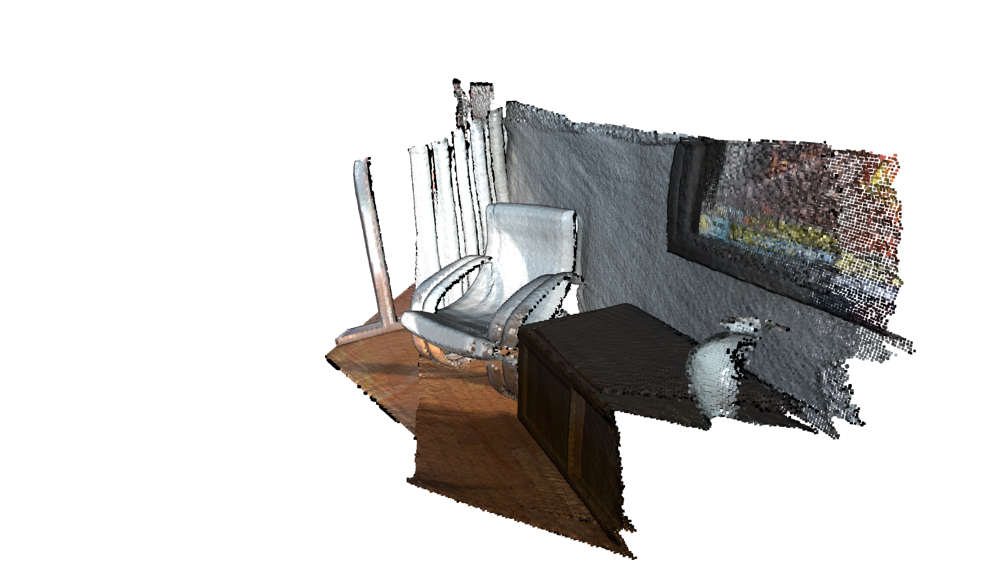

In [19]:
s = time.time()
# It is highly recommended to down-sample the point-cloud before using
# ICP algorithm, for better performance.

registration_icp = treg.icp(source, target, max_correspondence_distance,
                            init_source_to_target, estimation, criteria,
                            voxel_size, save_loss_log)

icp_time = time.time() - s
print("Time taken by ICP: ", icp_time)
print("Inlier Fitness: ", registration_icp.fitness)
print("Inlier RMSE: ", registration_icp.inlier_rmse)

draw_registration_result(source, target, registration_icp.transformation)

We may resolve the above issues and get even better accuracy by using `Multi-Scale ICP`

---

## Multi-Scale ICP Example

Problems with using Vanilla-ICP (previous version):

- Running the ICP algorithm on dense point-clouds is very slow. 
- It requires good initial alignment:
    - If the point-cloud is not well aligned, the convergence might get stuck in local-minima in initial iterations.
    - We need to have a larger `max_correspondence_distance` if the aligned point cloud does not have sufficient overlaps.  
- If point-cloud is heavily down-sampled (coarse), the obtained result will not be accurate. 

These drawbacks can be solved using Multi-Scale ICP.
In Multi-Scale ICP, we perform the initial iterations on coarse point-cloud to get a better estimate of initial alignment and use this alignment for convergence on a more dense point cloud. ICP on coarse point cloud is in-expensive, and allows us to use a larger `max_correspondence_distance`. It is also less likely for the convergence to get stuck in local minima. As we get a good estimate, it takes fewer iterations on dense point-cloud to converge to a more accurate transform. 

It is recommended to use `Multi-Scale ICP` over `ICP`, for efficient convergence, especially for large point clouds. 

#### 1. Set Inputs and Parameters

In [20]:
# Input point-clouds
source = o3d.t.io.read_point_cloud("../../test_data/ICP/cloud_bin_0.pcd")
target = o3d.t.io.read_point_cloud("../../test_data/ICP/cloud_bin_1.pcd")

In [21]:
voxel_sizes = o3d.utility.DoubleVector([0.1, 0.05, 0.025])

# List of Convergence-Criteria for Multi-Scale ICP:
criteria_list = [
    treg.ICPConvergenceCriteria(relative_fitness=0.0001,
                                relative_rmse=0.0001,
                                max_iteration=20),
    treg.ICPConvergenceCriteria(0.00001, 0.00001, 15),
    treg.ICPConvergenceCriteria(0.000001, 0.000001, 10)
]

# `max_correspondence_distances` for Multi-Scale ICP (o3d.utility.DoubleVector):
max_correspondence_distances = o3d.utility.DoubleVector([0.3, 0.14, 0.07])

# Initial alignment or source to target transform.
init_source_to_target = o3d.core.Tensor.eye(4, o3d.core.Dtype.Float32)

# Select the `Estimation Method`, and `Robust Kernel` (for outlier-rejection).
estimation = treg.TransformationEstimationPointToPlane()

# Save iteration wise `fitness`, `inlier_rmse`, etc. to analyse and tune result.
save_loss_log = True

#### 2. Get Registration Result from Multi-Scale ICP

Time taken by Multi-Scale ICP:  0.0898129940032959
Inlier Fitness:  0.6755352200192057
Inlier RMSE:  0.017570451328787495


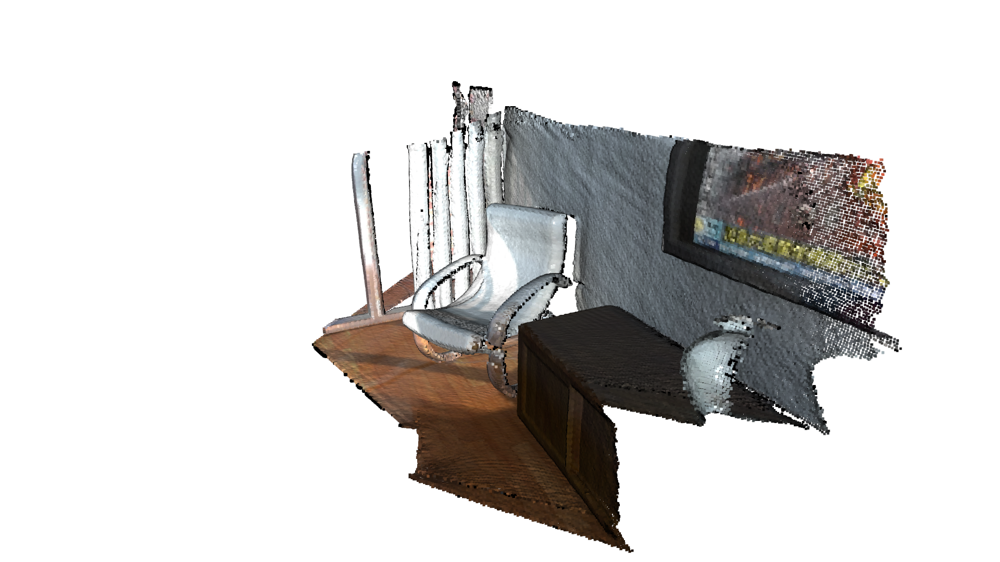

In [22]:
# Setting Verbosity to Debug, helps in fine-tuning the performance.
# o3d.utility.set_verbosity_level(o3d.utility.VerbosityLevel.Debug)

s = time.time()

registration_ms_icp = treg.multi_scale_icp(source, target, voxel_sizes,
                                           criteria_list,
                                           max_correspondence_distances,
                                           init_source_to_target, estimation,
                                           save_loss_log)

ms_icp_time = time.time() - s
print("Time taken by Multi-Scale ICP: ", ms_icp_time)
print("Inlier Fitness: ", registration_ms_icp.fitness)
print("Inlier RMSE: ", registration_ms_icp.inlier_rmse)

draw_registration_result(source, target, registration_ms_icp.transformation)

### Plotting Convergence Graph
We can use the `registration_result.loss_log`, to plot convergence and fine-tune our application.

In [23]:
from matplotlib import pyplot as plt


def plot_rmse(registration_result):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 5))
    axes.set_title("Inlier RMSE vs Iteration")
    axes.plot(registration_result.loss_log["index"].numpy(),
              registration_result.loss_log["inlier_rmse"].numpy())


def plot_scale_wise_rmse(registration_result):
    scales = registration_result.loss_log["scale"].numpy()
    iterations = registration_result.loss_log["iteration"].numpy()

    num_scales = scales[-1][0] + 1

    fig, axes = plt.subplots(nrows=1, ncols=num_scales, figsize=(20, 5))

    masks = {}
    for scale in range(0, num_scales):
        masks[scale] = registration_result.loss_log["scale"] == scale

        rmse = registration_result.loss_log["inlier_rmse"][masks[scale]].numpy()
        iteration = registration_result.loss_log["iteration"][
            masks[scale]].numpy()

        title_prefix = "Scale Index: " + str(scale)
        axes[scale].set_title(title_prefix + " Inlier RMSE vs Iteration")
        axes[scale].plot(iteration, rmse)

Vanilla ICP


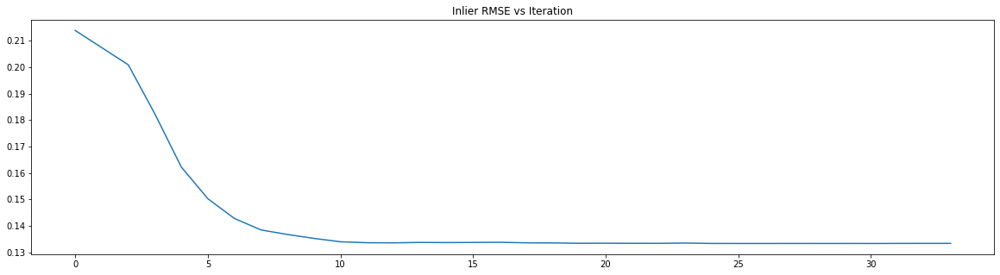

In [24]:
print("Vanilla ICP")
plot_rmse(registration_icp)

Multi Scale ICP


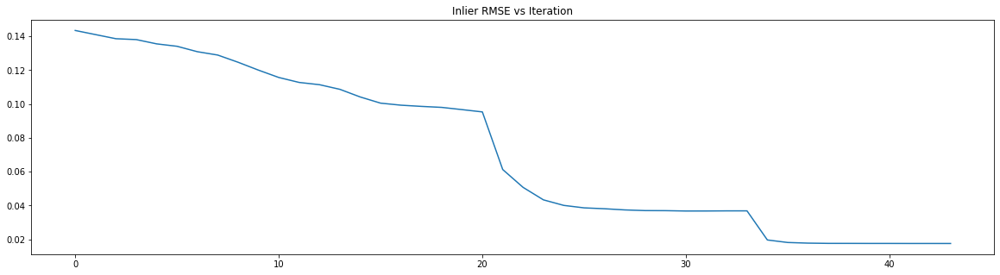

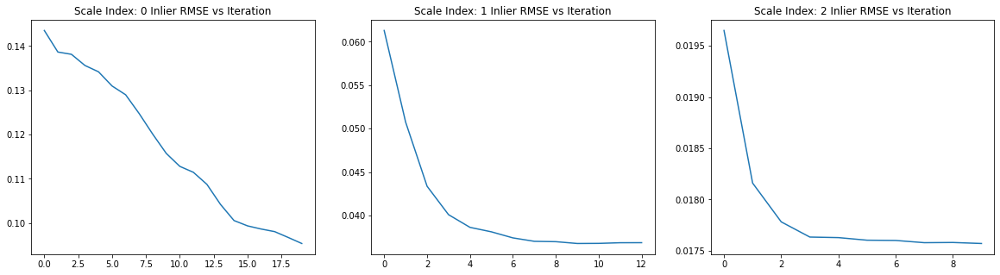

In [25]:
print("Multi Scale ICP")
plot_rmse(registration_ms_icp)
plot_scale_wise_rmse(registration_ms_icp)

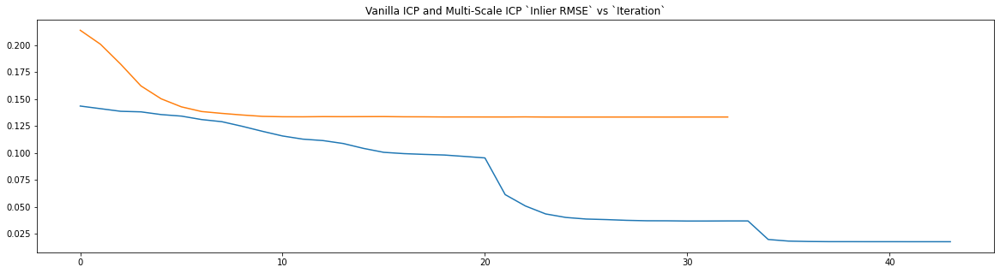

In [26]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 5))

axes.set_title("Vanilla ICP and Multi-Scale ICP `Inlier RMSE` vs `Iteration`")

if len(registration_ms_icp.loss_log["index"]) > len(
        registration_icp.loss_log["inlier_rmse"]):
    axes.plot(registration_ms_icp.loss_log["index"].numpy(),
              registration_ms_icp.loss_log["inlier_rmse"].numpy(),
              registration_icp.loss_log["inlier_rmse"].numpy())
else:
    axes.plot(registration_icp.loss_log["index"].numpy(),
              registration_icp.loss_log["inlier_rmse"].numpy(),
              registration_ms_icp.loss_log["inlier_rmse"].numpy())

---

### Multi-Scale ICP on CUDA device Example

In [27]:
# The algorithm runs on the same device as the source and target point-cloud.
source_cuda = source.cuda(0)
target_cuda = target.cuda(0)

Time taken by Multi-Scale ICP:  0.0459446907043457
Inlier Fitness:  0.6755352200192057
Inlier RMSE:  0.01756232818629148


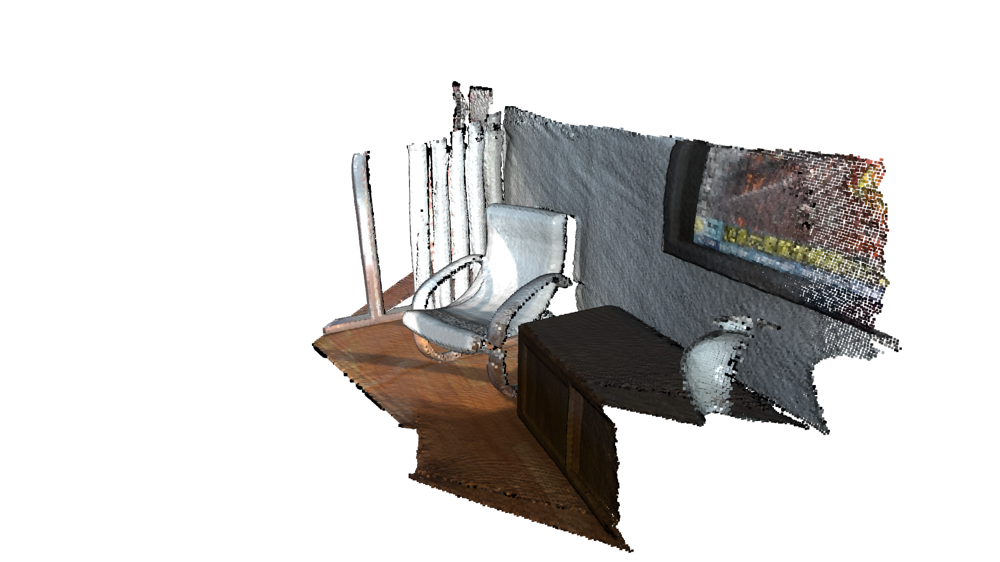

In [28]:
s = time.time()

registration_ms_icp = treg.multi_scale_icp(source_cuda, target_cuda,
                                           voxel_sizes, criteria_list,
                                           max_correspondence_distances,
                                           init_source_to_target, estimation,
                                           save_loss_log)

ms_icp_time = time.time() - s
print("Time taken by Multi-Scale ICP: ", ms_icp_time)
print("Inlier Fitness: ", registration_ms_icp.fitness)
print("Inlier RMSE: ", registration_ms_icp.inlier_rmse)

draw_registration_result(source.cpu(), target.cpu(),
                         registration_ms_icp.transformation)

---

## Case of `no correspondences`.
In case of `no_correspondences` the `fitness` and `inlier_rmse` is `0`. 

In [29]:
max_correspondence_distance = 0.02

init_source_to_target = np.asarray([[1.0, 0.0, 0.0, 5], [0.0, 1.0, 0.0, 7],
                                    [0.0, 0.0, 1.0, 10], [0.0, 0.0, 0.0, 1.0]])

registration_icp = treg.icp(source, target, max_correspondence_distance,
                            init_source_to_target)

print("Inlier Fitness: ", registration_icp.fitness)
print("Inlier RMSE: ", registration_icp.inlier_rmse)
print("Transformation: \n", registration_icp.transformation)

if registration_icp.fitness == 0 and registration_icp.inlier_rmse == 0:
    print("ICP Convergence Failed, as no correspondence were found")

[Open3D WARNING] 0 correspondence present between the pointclouds. Try increasing the max_correspondence_distance parameter.
[Open3D WARNING] 0 correspondence present between the pointclouds. Try increasing the max_correspondence_distance parameter.
Inlier Fitness:  0.0
Inlier RMSE:  0.0
Transformation: 
 [[1.0 0.0 0.0 0.0],
 [0.0 1.0 0.0 0.0],
 [0.0 0.0 1.0 0.0],
 [0.0 0.0 0.0 1.0]]
Tensor[shape={4, 4}, stride={4, 1}, Float64, CPU:0, 0x559b277a3a70]
ICP Convergence Failed, as no correspondence were found


---

## Information Matrix

`Information Matrix` gives us futher information about how well the point-clouds are alligned. 

In [30]:
information_matrix = treg.get_information_matrix(
    source, target, max_correspondence_distances[2],
    registration_ms_icp.transformation)

print(information_matrix)

[[845525. -521775. -421402. 0.0 -200603. 256853.],
 [-521775. 911410. -389198. 200603. 0.0 -267050.],
 [-421402. -389198. 1.1222e+06 -256853. 267050. 0.0],
 [0.0 200603. -256853. 130608. 0.0 0.0],
 [-200603. 0.0 267050. 0.0 130608. 0.0],
 [256853. -267050. 0.0 0.0 0.0 130608.]]
Tensor[shape={6, 6}, stride={6, 1}, Float64, CPU:0, 0x559b26904aa0]


---

Now that we have a basic understanding of the ICP algorithm and the API, let's experiment with the different versions to understand the difference

## Initial Allignment

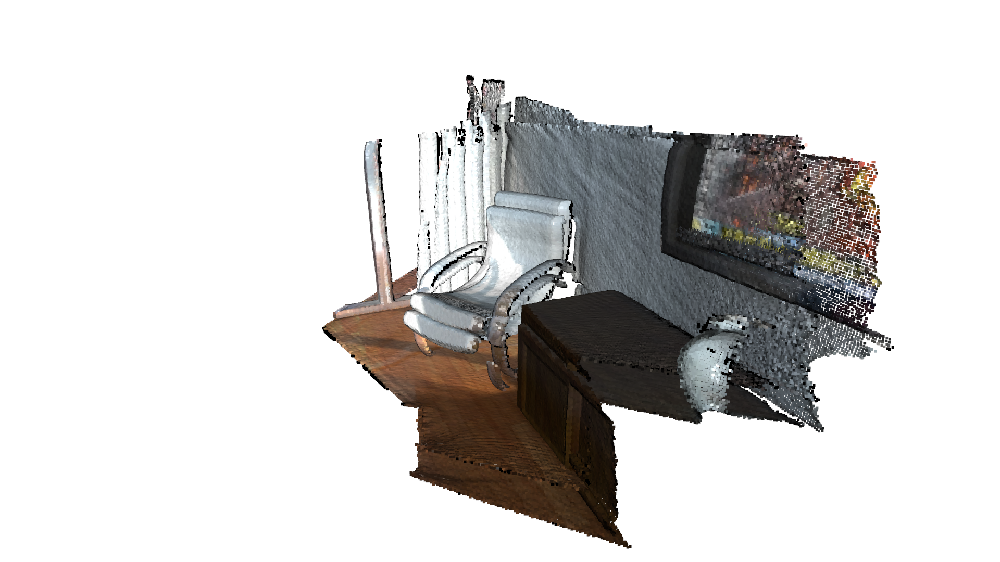

In [31]:
source = o3d.t.io.read_point_cloud("../../test_data/ICP/cloud_bin_0.pcd")
target = o3d.t.io.read_point_cloud("../../test_data/ICP/cloud_bin_1.pcd")

# Initial guess transform between the two point-cloud.
# ICP algortihm requires a good initial allignment to converge efficiently.
trans_init = np.asarray([[0.862, 0.011, -0.507, 0.5],
                         [-0.139, 0.967, -0.215, 0.7],
                         [0.487, 0.255, 0.835, -1.4], [0.0, 0.0, 0.0, 1.0]])

draw_registration_result(source, target, trans_init)

In [32]:
# Search distance for Nearest Neighbour Search [Hybrid-Search is used].
max_correspondence_distance = 0.02

print("Initial alignment")
evaluation = treg.evaluate_registration(source, target,
                                        max_correspondence_distance, trans_init)

print("Fitness: ", evaluation.fitness)
print("Inlier RMSE: ", evaluation.inlier_rmse)

Initial alignment
Fitness:  0.17472276007745116
Inlier RMSE:  0.01177106094721789


---
# Point-To-Point ICP Registration 

We first show a point-to-point ICP algorithm [\[BeslAndMcKay1992\]](../reference.html#beslandmckay1992) using the objective

\begin{equation}
E(\mathbf{T}) = \sum_{(\mathbf{p},\mathbf{q})\in\mathcal{K}}\|\mathbf{p} - \mathbf{T}\mathbf{q}\|^{2}
\end{equation}

The class `TransformationEstimationPointToPoint` provides functions to compute the residuals and Jacobian matrices of the point-to-point ICP objective.

#### 1. Set Inputs and Parameters

In [33]:
# Input point-clouds
source = o3d.t.io.read_point_cloud("../../test_data/ICP/cloud_bin_0.pcd")
target = o3d.t.io.read_point_cloud("../../test_data/ICP/cloud_bin_1.pcd")

In [34]:
# Select the `Estimation Method`, and `Robust Kernel` (for outlier-rejection).
estimation = treg.TransformationEstimationPointToPoint()

In [35]:
# Search distance for Nearest Neighbour Search [Hybrid-Search is used].
max_correspondence_distance = 0.02

# Initial alignment or source to target transform.
init_source_to_target = trans_init

# Convergence-Criteria for Vanilla ICP
criteria = treg.ICPConvergenceCriteria(relative_fitness=0.0000001,
                                       relative_rmse=0.0000001,
                                       max_iteration=30)

# Down-sampling voxel-size. If voxel_size < 0, original scale is used.
voxel_size = -1

# Save iteration wise `fitness`, `inlier_rmse`, etc. to analyse and tune result.
save_loss_log = True

Apply Point-to-Point ICP
Time taken by Point-To-Point ICP:  0.5277535915374756
Fitness:  0.3724696356275304
Inlier RMSE:  0.007761284201917864


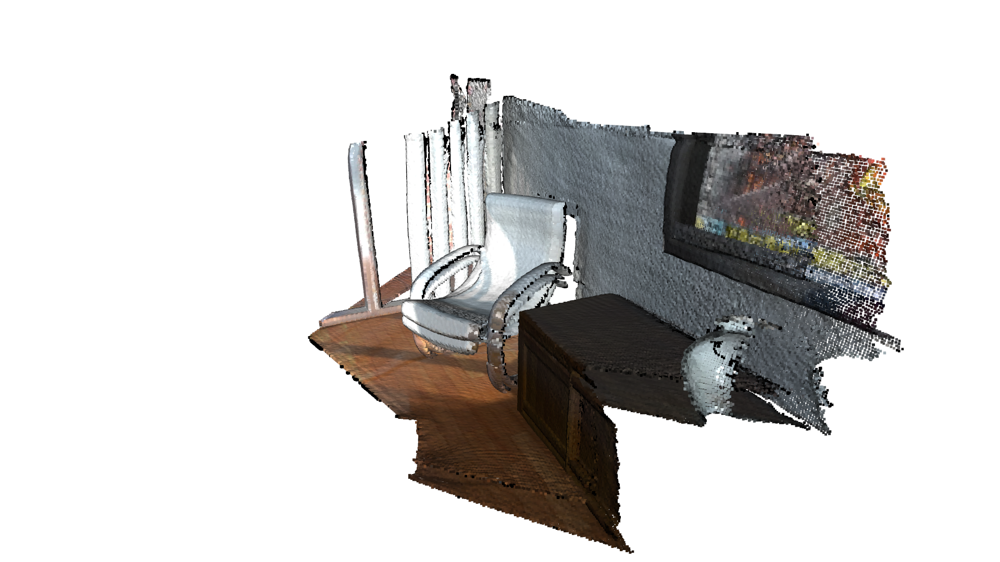

In [36]:
print("Apply Point-to-Point ICP")
s = time.time()

reg_point_to_point = treg.icp(source, target, max_correspondence_distance,
                              init_source_to_target, estimation, criteria,
                              voxel_size, save_loss_log)

icp_time = time.time() - s
print("Time taken by Point-To-Point ICP: ", icp_time)
print("Fitness: ", reg_point_to_point.fitness)
print("Inlier RMSE: ", reg_point_to_point.inlier_rmse)

draw_registration_result(source, target, reg_point_to_point.transformation)

The fitness score increases from `0.174722` to `0.372474`. The inlier_rmse reduces from `0.011771` to `0.007761`. 
By default, icp runs until convergence or reaches a maximum number of iterations (30 by default). 
It can be changed to allow more computation time and to improve the results further.

In [37]:
criteria = treg.ICPConvergenceCriteria(relative_fitness=0.0000001,
                                       relative_rmse=0.0000001,
                                       max_iteration=1000)

Apply Point-to-Point ICP
Time taken by Point-To-Point ICP:  2.9436988830566406
Fitness:  0.6211029245354188
Inlier RMSE:  0.006582087965412047


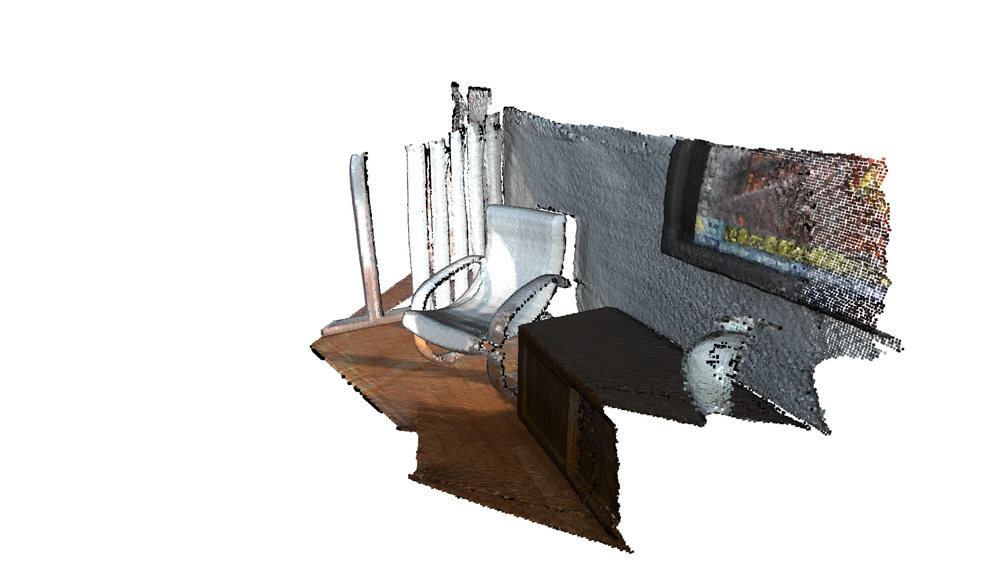

In [38]:
print("Apply Point-to-Point ICP")
s = time.time()

reg_point_to_point = treg.icp(source, target, max_correspondence_distance,
                              init_source_to_target, estimation, criteria,
                              voxel_size, save_loss_log)

icp_time = time.time() - s
print("Time taken by Point-To-Point ICP: ", icp_time)
print("Fitness: ", reg_point_to_point.fitness)
print("Inlier RMSE: ", reg_point_to_point.inlier_rmse)

draw_registration_result(source, target, reg_point_to_point.transformation)

The final alignment is tight. The fitness score improves to `0.620972`. The inlier_rmse reduces to `0.006581`.

---

# Point-to-Plane ICP Registration
The point-to-plane ICP algorithm [\[ChenAndMedioni1992\]](../reference.html#chenandmedioni1992) uses a different objective function

\begin{equation}
E(\mathbf{T}) = \sum_{(\mathbf{p},\mathbf{q})\in\mathcal{K}}\big((\mathbf{p} - \mathbf{T}\mathbf{q})\cdot\mathbf{n}_{\mathbf{p}}\big)^{2},
\end{equation}

where $\mathbf{n}_{\mathbf{p}}$ is the normal of point $\mathbf{p}$. [\[Rusinkiewicz2001\]](../reference.html#rusinkiewicz2001) has shown that the point-to-plane ICP algorithm has a faster convergence speed than the point-to-point ICP algorithm.

The class `TransformationEstimationPointToPlane` provides functions to compute the residuals and Jacobian matrices of the point-to-plane ICP objective. 

In [39]:
estimation = treg.TransformationEstimationPointToPlane()

criteria = treg.ICPConvergenceCriteria(relative_fitness=0.0000001,
                                       relative_rmse=0.0000001,
                                       max_iteration=30)

Apply Point-to-Plane ICP
Time taken by Point-To-Plane ICP:  0.5514256954193115
Fitness:  0.620972162848593
Inlier RMSE:  0.006581453462676543


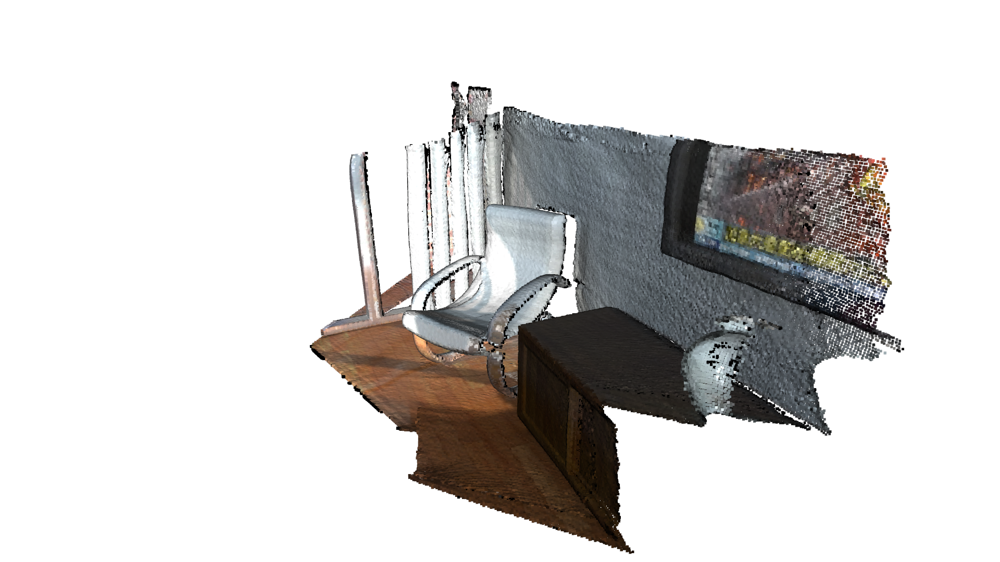

In [40]:
print("Apply Point-to-Plane ICP")
s = time.time()

reg_point_to_plane = treg.icp(source, target, max_correspondence_distance,
                              init_source_to_target, estimation, criteria,
                              voxel_size, save_loss_log)

icp_time = time.time() - s
print("Time taken by Point-To-Plane ICP: ", icp_time)
print("Fitness: ", reg_point_to_plane.fitness)
print("Inlier RMSE: ", reg_point_to_plane.inlier_rmse)

draw_registration_result(source, target, reg_point_to_plane.transformation)

The point-to-plane ICP reaches tight alignment within 30 iterations (a `fitness` score of 0.620972 and an `inlier_rmse` score of 0.006581).

---

# Colored ICP Registration
This tutorial demonstrates an ICP variant that uses both geometry and color for registration. It implements the algorithm of [\[Park2017\]](../reference.html#park2017). The color information locks the alignment along the tangent plane. Thus this algorithm is more accurate and more robust than prior point cloud registration algorithms, while the running speed is comparable to that of ICP registration. 

In [41]:
# Overriding visualization function, according to best camera view for colored-icp sample data.
def draw_registration_result(source, target, transformation):
    source_temp = source.clone()
    target_temp = target.clone()

    source_temp.transform(transformation)

    # This is patched version for tutorial rendering.
    # Use `draw` function for you application.
    o3d.visualization.draw_geometries(
        [source_temp.to_legacy(),
         target_temp.to_legacy()],
        zoom=0.5,
        front=[-0.2458, -0.8088, 0.5342],
        lookat=[1.7745, 2.2305, 0.9787],
        up=[0.3109, -0.5878, -0.7468])

1. Load two point clouds and show initial pose


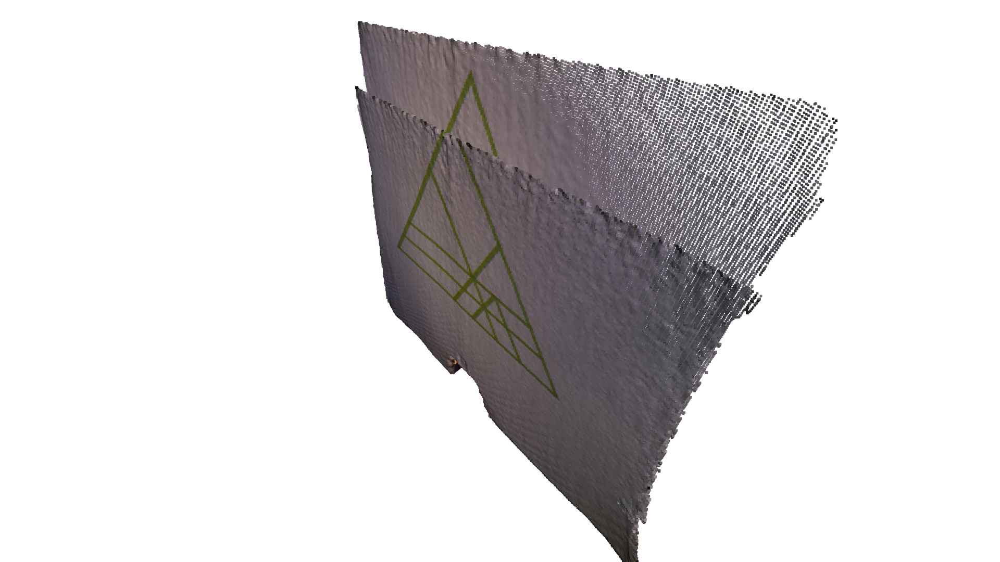

In [42]:
print("1. Load two point clouds and show initial pose")
source = o3d.t.io.read_point_cloud("../../test_data/ColoredICP/frag_115.ply")
target = o3d.t.io.read_point_cloud("../../test_data/ColoredICP/frag_116.ply")

# For Colored-ICP `colors` attribute must be of the same dtype as `positions` and `normals` attribute.
source.point["colors"] = source.point["colors"].to(
    o3d.core.Dtype.Float32) / 255.0
target.point["colors"] = target.point["colors"].to(
    o3d.core.Dtype.Float32) / 255.0

# draw initial alignment
current_transformation = np.identity(4)
draw_registration_result(source, target, current_transformation)

## Setting baseline with point-to-plane registration
We first run Point-to-plane ICP as a baseline approach. The visualization below shows misaligned green triangle textures. This is because a geometric constraint does not prevent two planar surfaces from slipping.

In [43]:
estimation = treg.TransformationEstimationPointToPlane()

In [44]:
max_correspondence_distance = 0.02
init_source_to_target = np.identity(4)

Apply Point-to-Plane ICP
Time taken by Point-To-Plane ICP:  0.39415907859802246
Fitness:  0.9746756777751884
Inlier RMSE:  0.004219132317882591


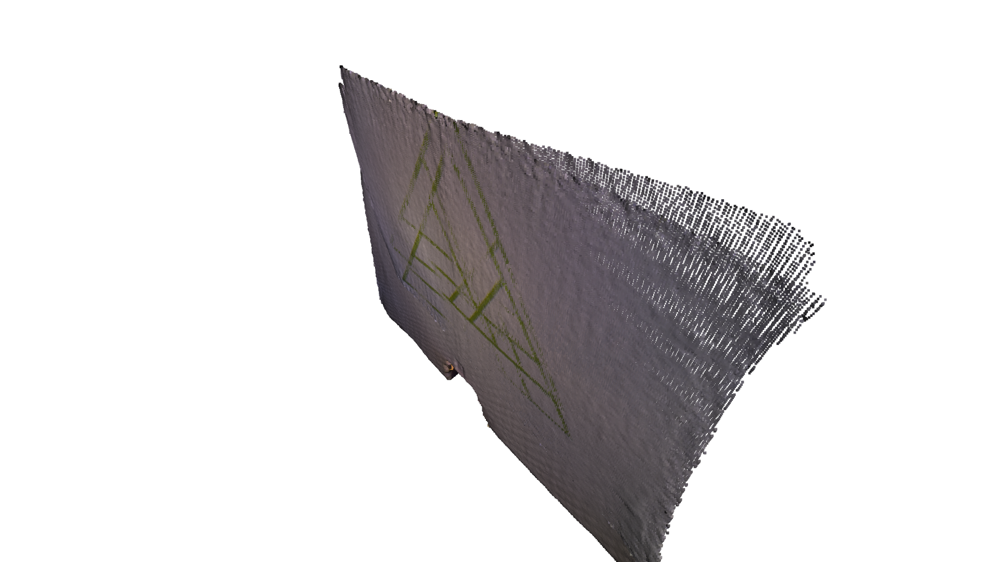

In [45]:
print("Apply Point-to-Plane ICP")
s = time.time()

reg_point_to_plane = treg.icp(source, target, max_correspondence_distance,
                              init_source_to_target, estimation)

icp_time = time.time() - s
print("Time taken by Point-To-Plane ICP: ", icp_time)
print("Fitness: ", reg_point_to_plane.fitness)
print("Inlier RMSE: ", reg_point_to_plane.inlier_rmse)

draw_registration_result(source, target, reg_point_to_plane.transformation)

## Colored Registration
The core function for colored point cloud registration is `registration_colored_icp`. Following [\[Park2017\]](../reference.html#park2017), it runs ICP iterations (see [Point-to-point ICP](../pipelines/icp_registration.ipynb#Point-to-point-ICP) for details) with a joint optimization objective

\begin{equation}
E(\mathbf{T}) = (1-\delta)E_{C}(\mathbf{T}) + \delta E_{G}(\mathbf{T})
\end{equation}

where $\mathbf{T}$ is the transformation matrix to be estimated. $E_{C}$ and $E_{G}$ are the photometric and geometric terms, respectively. $\delta\in[0,1]$ is a weight parameter that has been determined empirically.

The geometric term $E_{G}$ is the same as the [Point-to-plane ICP](../pipelines/icp_registration.ipynb#Point-to-plane-ICP) objective

\begin{equation}
E_{G}(\mathbf{T}) = \sum_{(\mathbf{p},\mathbf{q})\in\mathcal{K}}\big((\mathbf{p} - \mathbf{T}\mathbf{q})\cdot\mathbf{n}_{\mathbf{p}}\big)^{2},
\end{equation}

where $\mathcal{K}$ is the correspondence set in the current iteration. $\mathbf{n}_{\mathbf{p}}$ is the normal of point $\mathbf{p}$.

The color term $E_{C}$ measures the difference between the color of point $\mathbf{q}$ (denoted as $C(\mathbf{q})$) and the color of its projection on the tangent plane of $\mathbf{p}$.

\begin{equation}
E_{C}(\mathbf{T}) = \sum_{(\mathbf{p},\mathbf{q})\in\mathcal{K}}\big(C_{\mathbf{p}}(\mathbf{f}(\mathbf{T}\mathbf{q})) - C(\mathbf{q})\big)^{2},
\end{equation}

where $C_{\mathbf{p}}(\cdot)$ is a precomputed function continuously defined on the tangent plane of $\mathbf{p}$. Function$\mathbf{f}(\cdot)$ projects a 3D point to the tangent plane. For more details, refer to [\[Park2017\]](../reference.html#park2017).

To further improve efficiency, [\[Park2017\]](../reference.html#park2017) proposes a multi-scale registration scheme. 

In [46]:
estimation = treg.TransformationEstimationForColoredICP()

In [47]:
current_transformation = np.identity(4)

criteria_list = [
    treg.ICPConvergenceCriteria(relative_fitness=0.0001,
                                relative_rmse=0.0001,
                                max_iteration=50),
    treg.ICPConvergenceCriteria(0.00001, 0.00001, 30),
    treg.ICPConvergenceCriteria(0.000001, 0.000001, 14)
]

max_correspondence_distances = o3d.utility.DoubleVector([0.08, 0.04, 0.02])

voxel_sizes = o3d.utility.DoubleVector([0.04, 0.02, 0.01])

Colored point cloud registration
Time taken by Colored ICP:  0.1485738754272461
Fitness:  0.9746756777751884
Inlier RMSE:  0.004219132317882591


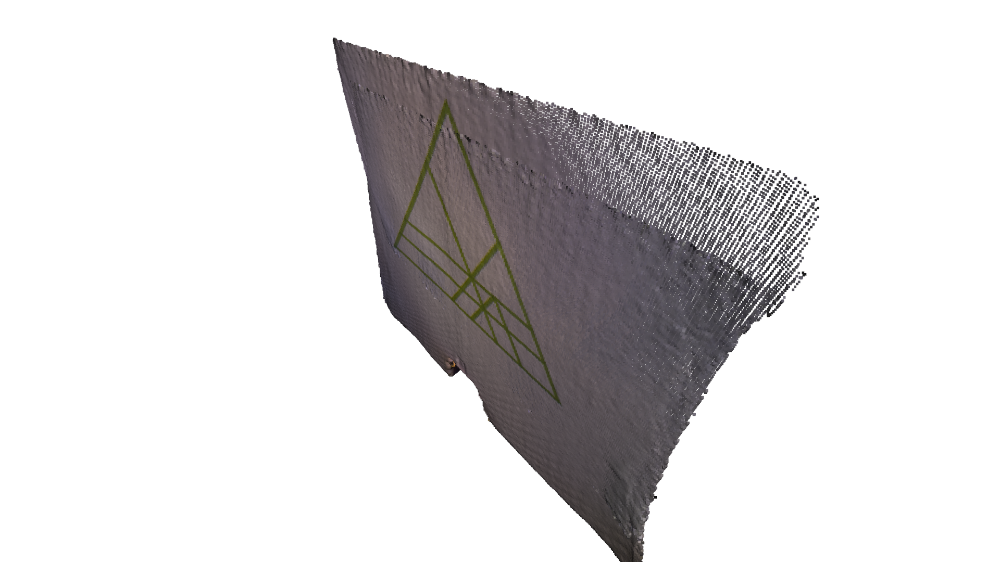

In [48]:
# colored pointcloud registration
# This is implementation of following paper
# J. Park, Q.-Y. Zhou, V. Koltun,
# Colored Point Cloud Registration Revisited, ICCV 2017

print("Colored point cloud registration")
s = time.time()

reg_multiscale_icp = treg.multi_scale_icp(source, target, voxel_sizes,
                                          criteria_list,
                                          max_correspondence_distances,
                                          init_source_to_target, estimation)

icp_time = time.time() - s
print("Time taken by Colored ICP: ", icp_time)
print("Fitness: ", reg_point_to_plane.fitness)
print("Inlier RMSE: ", reg_point_to_plane.inlier_rmse)

draw_registration_result(source, target, reg_multiscale_icp.transformation)